In [3]:
import pandas as pd

# Load the uploaded CSV file
file_path = "markets_cleaned.csv"
df = pd.read_csv(file_path)

# Display basic information about the dataset
df_info = df.info()
df_head = df.head()
df_description = df.describe(include='all')

df_info, df_head, df_description


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5343 entries, 0 to 5342
Data columns (total 39 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      5343 non-null   int64  
 1   name            5343 non-null   object 
 2   city            5340 non-null   object 
 3   county          5341 non-null   object 
 4   state           5343 non-null   object 
 5   lat             5339 non-null   float64
 6   lon             5339 non-null   float64
 7   months_open     5343 non-null   int64  
 8   Bakedgoods      5343 non-null   int64  
 9   Beans           5343 non-null   int64  
 10  Cheese          5343 non-null   int64  
 11  Coffee          5343 non-null   int64  
 12  Crafts          5343 non-null   int64  
 13  Eggs            5343 non-null   int64  
 14  Flowers         5343 non-null   int64  
 15  Fruits          5343 non-null   int64  
 16  Grains          5343 non-null   int64  
 17  Herbs           5343 non-null   i

(None,
    Unnamed: 0                             name          city      county  \
 0           0                    Island Market     Key Largo      Monroe   
 1           1    COFFO Harvest Farmers' Market  Florida City  Miami-Dade   
 2           2    COFFO Harvest Farmers' Market     Homestead  Miami-Dade   
 3           3     Verde Gardens Farmers Market     Homestead  Miami-Dade   
 4           4  Verde Community Farm and Market     Homestead  Miami-Dade   
 
      state        lat        lon  months_open  Bakedgoods  Beans  ...  \
 0  Florida -80.427218  25.109214            6           1      1  ...   
 1  Florida -80.482299  25.449850           12           0      0  ...   
 2  Florida -80.483400  25.463500           12           0      0  ...   
 3  Florida -80.395607  25.506727           12           0      0  ...   
 4  Florida -80.395607  25.506727            9           0      0  ...   
 
    Prepared  Seafood  Soap  Tofu  Trees  Vegetables  WildHarvested  Wine  \
 0    

Dataset "Market Cleaned" memiliki 5343 baris dan 39 kolom, masing-masing mewakili pasar petani di Amerika Serikat dengan detail seperti lokasi, jenis produk yang dijual, dan durasi operasional. Berikut adalah analisis eksplorasi data (EDA) lanjutan yang menyeluruh dan profesional:

🔍 1. Pemahaman Kolom Data
Kolom lokasi: name, city, county, state, lat, lon

Kolom aktivitas: months_open, num_items_sold

Kolom produk (tipe binary 0/1): Bakedgoods, Beans, Cheese, ..., Wine

state_pop: Populasi negara bagian tempat pasar berada

📊 2. Statistik Deskriptif Kunci
Rata-rata bulan operasi pasar: 6.38 bulan

Rata-rata jumlah produk berbeda yang dijual di pasar: 13.54 item

Jenis produk paling umum: Vegetables (95.7% pasar menjual sayuran)

Produk kurang umum: Tofu (hanya 4% pasar menjual tahu)

📈 3. Visualisasi dan Analisis Lanjutan
Akan dibuat grafik dan analisis untuk menjawab pertanyaan seperti:

Produk Apa yang Paling Populer di Pasar?

Distribusi Pasar Berdasarkan Negara Bagian

Hubungan antara Jumlah Produk Dijual dan Bulan Operasi

Korelasi antara Populasi Negara Bagian dan Jumlah Pasar

<ipython-input-4-49b93b982a5a>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=product_popularity.index, y=product_popularity.values, palette="viridis")


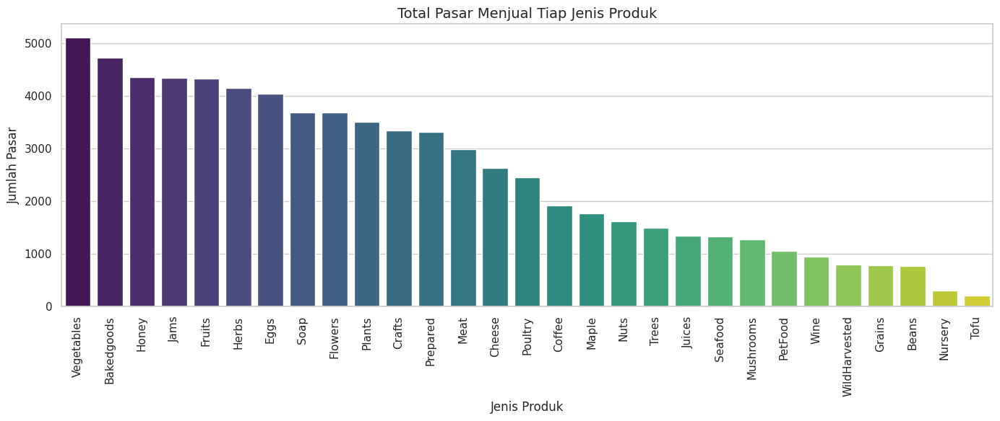

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style for better visuals
sns.set(style="whitegrid")

# 1. Produk paling populer di pasar
product_columns = df.columns[8:37]
product_popularity = df[product_columns].sum().sort_values(ascending=False)

plt.figure(figsize=(14, 6))
sns.barplot(x=product_popularity.index, y=product_popularity.values, palette="viridis")
plt.xticks(rotation=90)
plt.title("Total Pasar Menjual Tiap Jenis Produk", fontsize=14)
plt.ylabel("Jumlah Pasar")
plt.xlabel("Jenis Produk")
plt.tight_layout()
plt.show()


<ipython-input-5-c3e5023a9ab2>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=state_counts.index, y=state_counts.values, palette="crest")


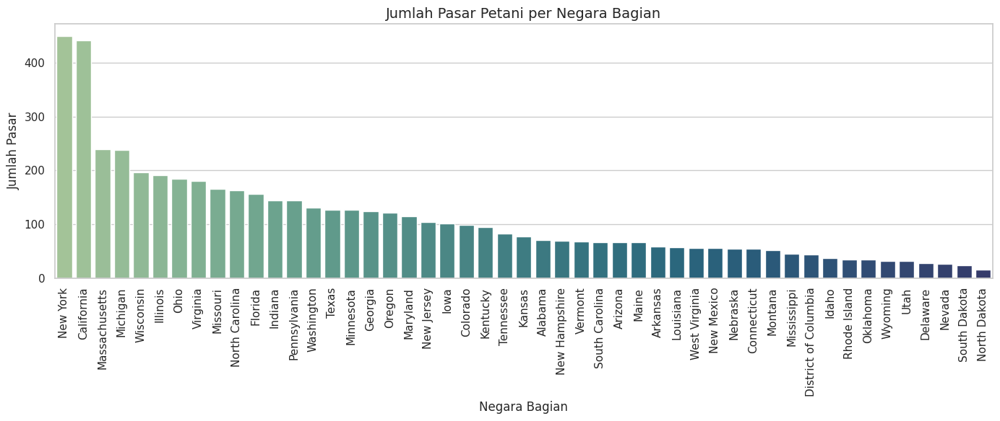

In [5]:
# 2. Distribusi jumlah pasar berdasarkan negara bagian
state_counts = df['state'].value_counts().sort_values(ascending=False)

plt.figure(figsize=(14, 6))
sns.barplot(x=state_counts.index, y=state_counts.values, palette="crest")
plt.xticks(rotation=90)
plt.title("Jumlah Pasar Petani per Negara Bagian", fontsize=14)
plt.ylabel("Jumlah Pasar")
plt.xlabel("Negara Bagian")
plt.tight_layout()
plt.show()


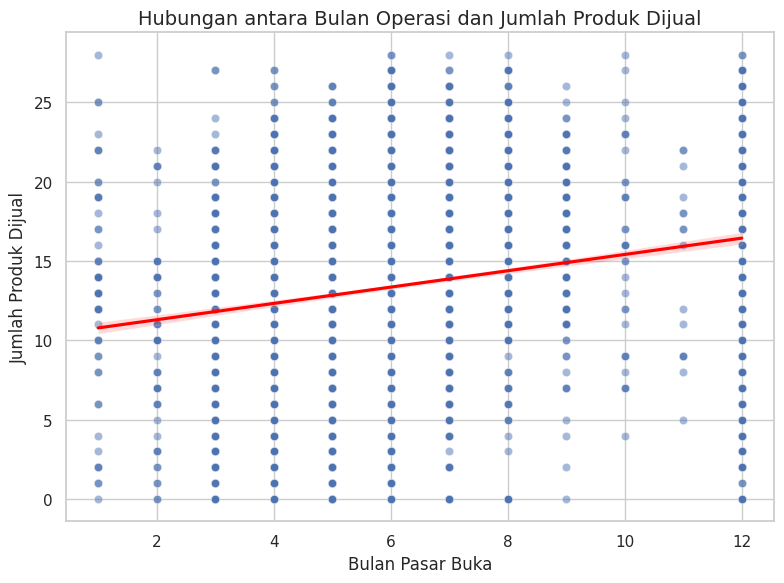

In [6]:
# 3. Korelasi antara jumlah produk yang dijual dan bulan buka
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='months_open', y='num_items_sold', alpha=0.5)
sns.regplot(data=df, x='months_open', y='num_items_sold', scatter=False, color='red')
plt.title("Hubungan antara Bulan Operasi dan Jumlah Produk Dijual", fontsize=14)
plt.xlabel("Bulan Pasar Buka")
plt.ylabel("Jumlah Produk Dijual")
plt.tight_layout()
plt.show()


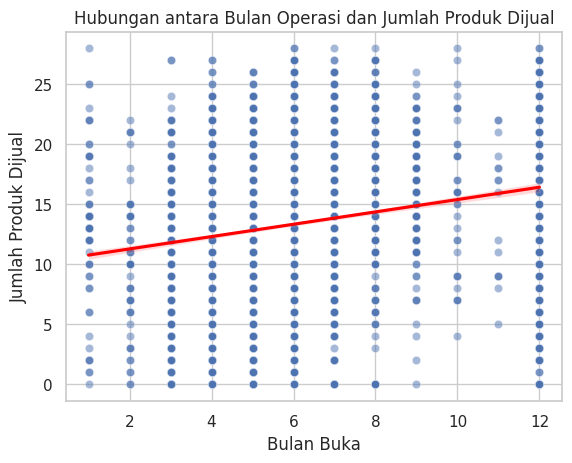

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

# Scatter plot dengan garis regresi
sns.scatterplot(data=df, x='months_open', y='num_items_sold', alpha=0.5)
sns.regplot(data=df, x='months_open', y='num_items_sold', scatter=False, color='red')
plt.title("Hubungan antara Bulan Operasi dan Jumlah Produk Dijual")
plt.xlabel("Bulan Buka")
plt.ylabel("Jumlah Produk Dijual")
plt.show()


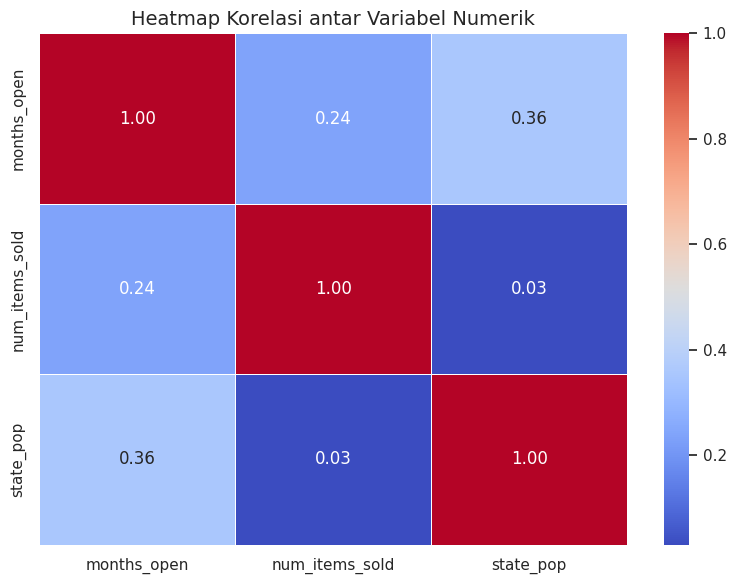

In [8]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load dataset
df = pd.read_csv("markets_cleaned.csv")

# Pilih kolom numerik yang relevan untuk korelasi
numerical_columns = ['months_open', 'num_items_sold', 'state_pop']
correlation_matrix = df[numerical_columns].corr()

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Heatmap Korelasi antar Variabel Numerik", fontsize=14)
plt.tight_layout()
plt.show()


In [9]:
pip install folium


In [10]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

# Load data
df = pd.read_csv("markets_cleaned.csv")

# Buat peta dasar (pusat Amerika Serikat)
usa_map = folium.Map(location=[39.8283, -98.5795], zoom_start=5)

# Cluster marker agar lebih rapi
marker_cluster = MarkerCluster().add_to(usa_map)

# Tambahkan marker per baris
for index, row in df.iterrows():
    if pd.notnull(row['lat']) and pd.notnull(row['lon']):
        folium.Marker(
            location=[row['lat'], row['lon']],
            popup=f"<strong>{row['name']}</strong><br>{row['city']}, {row['state']}",
            icon=folium.Icon(color='green', icon='leaf')
        ).add_to(marker_cluster)

# Tampilkan peta
usa_map


<ipython-input-11-4490388bc886>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='months_open', palette='viridis')


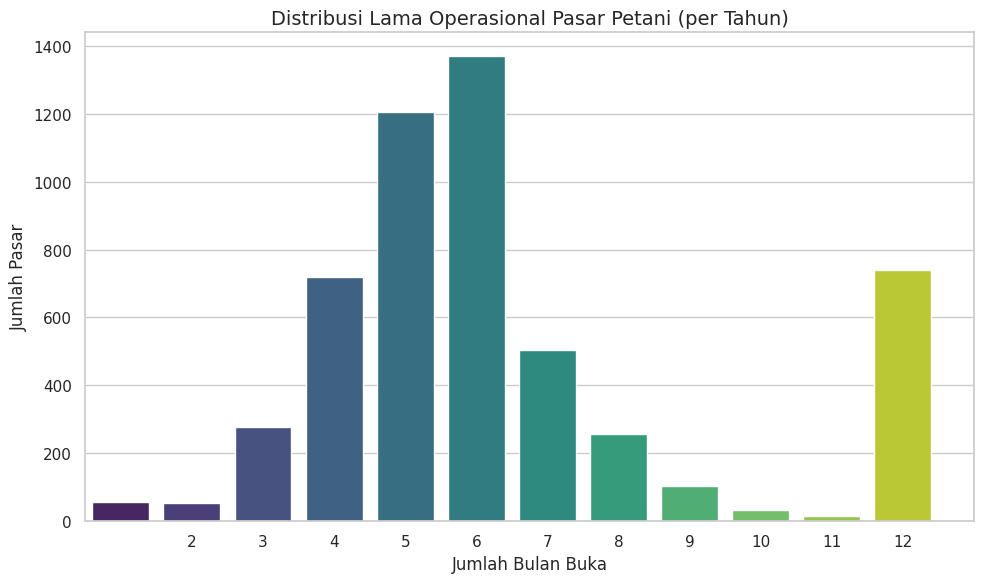

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
df = pd.read_csv("markets_cleaned.csv")

# Plot distribusi jumlah bulan buka
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='months_open', palette='viridis')

plt.title("Distribusi Lama Operasional Pasar Petani (per Tahun)", fontsize=14)
plt.xlabel("Jumlah Bulan Buka")
plt.ylabel("Jumlah Pasar")
plt.xticks(range(1, 13))  # Pastikan label bulan dari 1 sampai 12
plt.tight_layout()
plt.show()


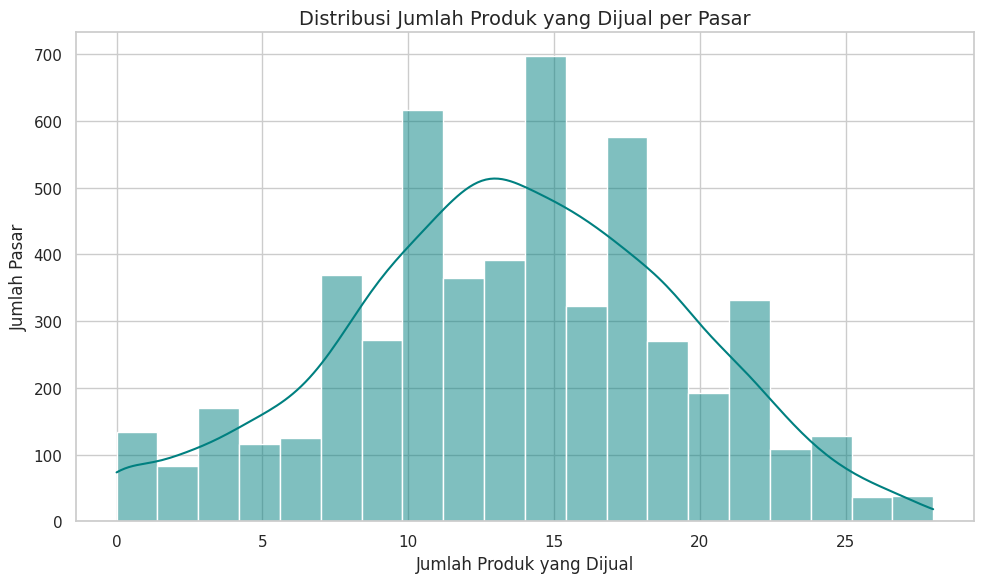

Rata-rata produk per pasar: 13.544076361594609


In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
df = pd.read_csv("markets_cleaned.csv")

# Plot distribusi jumlah produk yang dijual
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='num_items_sold', bins=20, kde=True, color='teal')

plt.title("Distribusi Jumlah Produk yang Dijual per Pasar", fontsize=14)
plt.xlabel("Jumlah Produk yang Dijual")
plt.ylabel("Jumlah Pasar")
plt.tight_layout()
plt.show()
print("Rata-rata produk per pasar:", df['num_items_sold'].mean())
